## Note: 
1.As the data is divided into 2 datasets <br>
2.In this datset i'm performing weekwise prediction of bike count <br>
3.i'm converting the date data into week number so that i can make weekwise and monthwise prediction<br>

In [120]:
import numpy as np
import pandas as pd
import seaborn as sns 
import matplotlib.pyplot as plt
import sklearn
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import GridSearchCV

from sklearn.model_selection import train_test_split

from sklearn.metrics import roc_curve, auc,classification_report,accuracy_score
from sklearn.metrics import mean_squared_error ,mean_absolute_error,log_loss
from sklearn.metrics import confusion_matrix

import warnings
warnings.filterwarnings('ignore')

In [121]:
#converting into dataframe
df_day = pd.read_csv('day.csv',parse_dates=['dteday'])

In [122]:
df_day['Week_Number'] = df_day['dteday'].dt.week
df_day=df_day.drop(['dteday'],axis=1)

In [123]:
df_day.head()

,instant,season,yr,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,cnt,Week_Number
0,1,1,0,1,0,6,0,2,0.344167,0.363625,0.805833,0.160446,331,654,985,52
1,2,1,0,1,0,0,0,2,0.363478,0.353739,0.696087,0.248539,131,670,801,52
2,3,1,0,1,0,1,1,1,0.196364,0.189405,0.437273,0.248309,120,1229,1349,1
3,4,1,0,1,0,2,1,1,0.200000,0.212122,0.590435,0.160296,108,1454,1562,1
4,5,1,0,1,0,3,1,1,0.226957,0.229270,0.436957,0.186900,82,1518,1600,1


In [124]:

print(df_day.shape)

(731, 16)


### Imputing Missing Values 

In [125]:
df_day.isnull().sum()

instant        0
season         0
yr             0
mnth           0
holiday        0
weekday        0
workingday     0
weathersit     0
temp           0
atemp          0
hum            0
windspeed      0
casual         0
registered     0
cnt            0
Week_Number    0
dtype: int64

In [126]:
df_day['instant'].describe()

count    731.000000
mean     366.000000
std      211.165812
min        1.000000
25%      183.500000
50%      366.000000
75%      548.500000
max      731.000000
Name: instant, dtype: float64

In [127]:
df_day['season'].value_counts()

3    188
2    184
1    181
4    178
Name: season, dtype: int64

In [128]:
df_day['yr'].value_counts()

1    366
0    365
Name: yr, dtype: int64

In [129]:
df_day['mnth'].value_counts()

12    62
10    62
8     62
7     62
5     62
3     62
1     62
11    60
9     60
6     60
4     60
2     57
Name: mnth, dtype: int64

In [130]:
df_day['holiday'].value_counts()

0    710
1     21
Name: holiday, dtype: int64

In [131]:
df_day['weekday'].value_counts()

6    105
1    105
0    105
5    104
4    104
3    104
2    104
Name: weekday, dtype: int64

In [132]:
df_day['workingday'].value_counts()

1    500
0    231
Name: workingday, dtype: int64

In [133]:
df_day['weathersit'].value_counts()

1    463
2    247
3     21
Name: weathersit, dtype: int64

As we see instant is the given id for each entry ,so we are droping it and using the default index

In [134]:
df_day.drop('instant',axis=1,inplace=True)

# 3. Exploratory Data Analysis Data Visualization

## A.Univariate analysis

Scatter plot with color encoding:


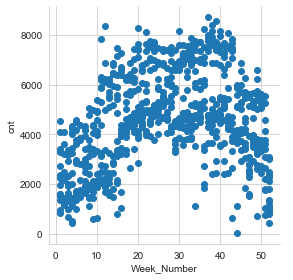

In [135]:
print('Scatter plot with color encoding:')
sns.set_style('whitegrid')
sns.FacetGrid(df_day,height=4)\
   .map(plt.scatter,'Week_Number','cnt')\
   .add_legend();
plt.show();
plt.close();

Summary:<br>
1.Weeks 16-35  have more number of count <br>
2.Which means May to September have more number of pickups .

## Lets check how's the weather and temperature in this this high pickups weeks

In [136]:
df=df_day.where(df_day['Week_Number']>16 )
df=df_day.where(df_day['Week_Number']<35 )

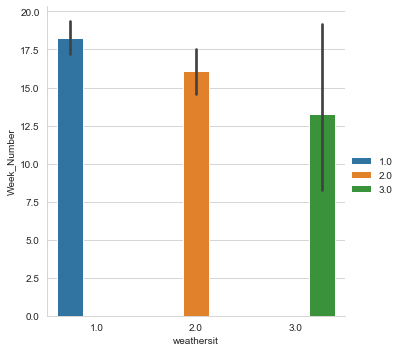

In [137]:
sns.catplot(x="weathersit", y="Week_Number",hue="weathersit", kind="bar", data=df)\
             .add_legend();

Scatter plot with color encoding:


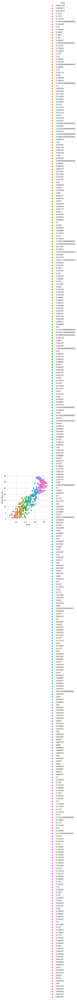

In [138]:
print('Scatter plot with color encoding:')
sns.set_style('whitegrid')
sns.FacetGrid(df,hue='temp',height=4)\
   .map(plt.scatter,'temp','Week_Number')\
   .add_legend();
plt.show();
plt.close();

Summary:<br>
1.The weeks in which we have higher number of pickups tend to have weather of type 1, which is Clear, Few clouds , people avoid bike sharing in cloudy wheather<br>
2.From 2nd graph we can see also in high temperature there are higher number of pickups

(array([  7.,  36.,  90., 104.,  93.,  80.,  93., 101., 103.,  24.]),
 array([0.0591304 , 0.13938406, 0.21963772, 0.29989138, 0.38014504,
        0.4603987 , 0.54065236, 0.62090602, 0.70115968, 0.78141334,
        0.861667  ]),
 <a list of 10 Patch objects>)

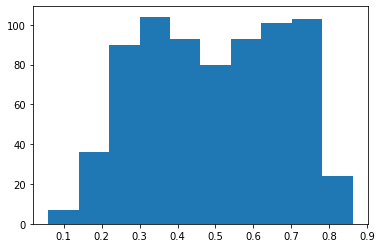

In [35]:
plt.hist( df_day['temp'],bins=10)

(array([ 11.,  34.,  97.,  99.,  98.,  93., 122., 112.,  57.,   8.]),
 array([0.0790696 , 0.15525224, 0.23143488, 0.30761752, 0.38380016,
        0.4599828 , 0.53616544, 0.61234808, 0.68853072, 0.76471336,
        0.840896  ]),
 <a list of 10 Patch objects>)

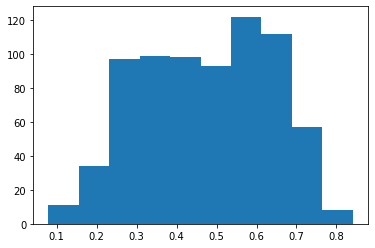

In [36]:
plt.hist( df_day['atemp'],bins=10)

(array([  1.,   1.,   3.,  18.,  95., 173., 164., 169.,  73.,  34.]),
 array([0.     , 0.09725, 0.1945 , 0.29175, 0.389  , 0.48625, 0.5835 ,
        0.68075, 0.778  , 0.87525, 0.9725 ]),
 <a list of 10 Patch objects>)

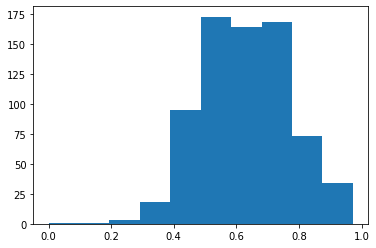

In [37]:
plt.hist( df_day['hum'],bins=10)

(array([ 26.,  99., 191., 173., 124.,  62.,  35.,  14.,   6.,   1.]),
 array([0.0223917 , 0.07089883, 0.11940596, 0.16791309, 0.21642022,
        0.26492735, 0.31343448, 0.36194161, 0.41044874, 0.45895587,
        0.507463  ]),
 <a list of 10 Patch objects>)

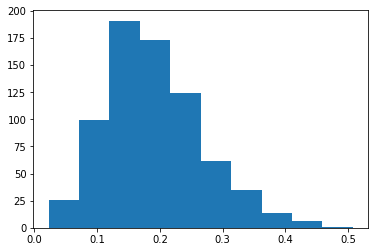

In [38]:
plt.hist( df_day['windspeed'],bins=10)

(array([ 14.,  44.,  79.,  80., 113., 144.,  85.,  71.,  57.,  44.]),
 array([  20. ,  712.6, 1405.2, 2097.8, 2790.4, 3483. , 4175.6, 4868.2,
        5560.8, 6253.4, 6946. ]),
 <a list of 10 Patch objects>)

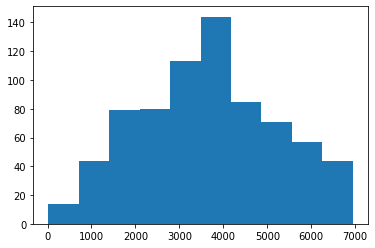

In [40]:
plt.hist( df_day['registered'],bins=10)

## B. Bivariate Analysis

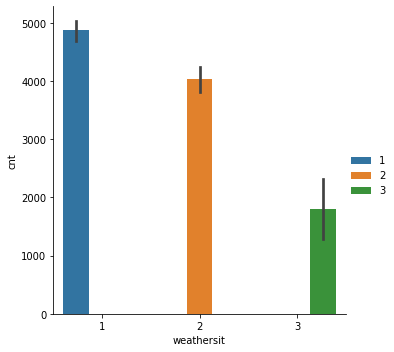

In [42]:
sns.catplot(x="weathersit", y="cnt",hue="weathersit", kind="bar", data=df_day)\
             .add_legend();

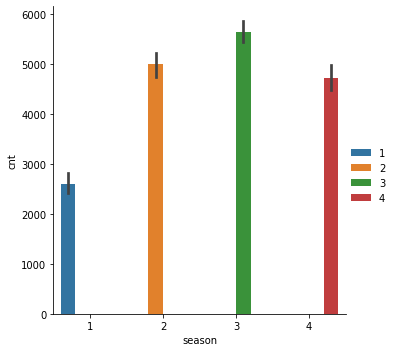

In [44]:
sns.catplot(x="season", y="cnt",hue="season", kind="bar", data=df_day)\
             .add_legend();

In [45]:
df_day.columns

Index(['dteday', 'season', 'yr', 'mnth', 'holiday', 'weekday', 'workingday',
       'weathersit', 'temp', 'atemp', 'hum', 'windspeed', 'casual',
       'registered', 'cnt'],
      dtype='object')

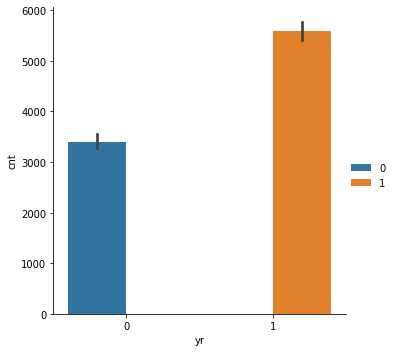

In [46]:
sns.catplot(x="yr", y="cnt",hue="yr", kind="bar", data=df_day)\
             .add_legend();

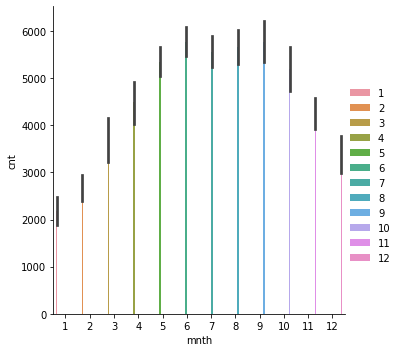

In [47]:
sns.catplot(x="mnth", y="cnt",hue="mnth", kind="bar", data=df_day)\
             .add_legend();

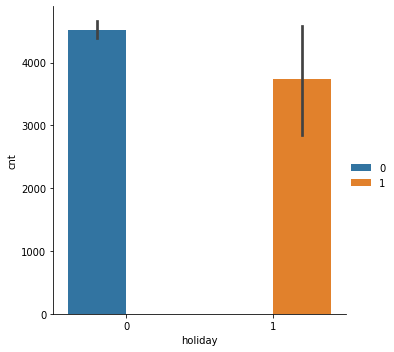

In [48]:
sns.catplot(x="holiday", y="cnt",hue="holiday", kind="bar", data=df_day)\
             .add_legend();

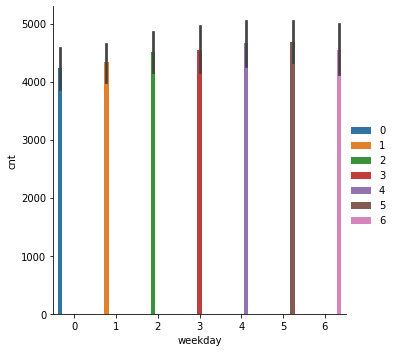

In [49]:
sns.catplot(x="weekday", y="cnt",hue="weekday", kind="bar", data=df_day)\
             .add_legend();

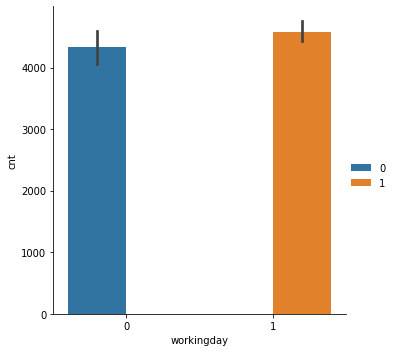

In [50]:
sns.catplot(x="workingday", y="cnt",hue="workingday", kind="bar", data=df_day)\
             .add_legend();

## C.Multivariate Analysis

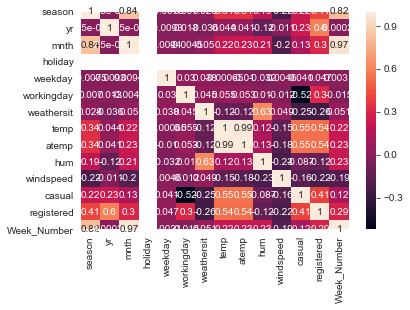

In [175]:
corr=df_day.drop(['cnt'],axis=1).corr()
sns.heatmap(corr, annot=True)

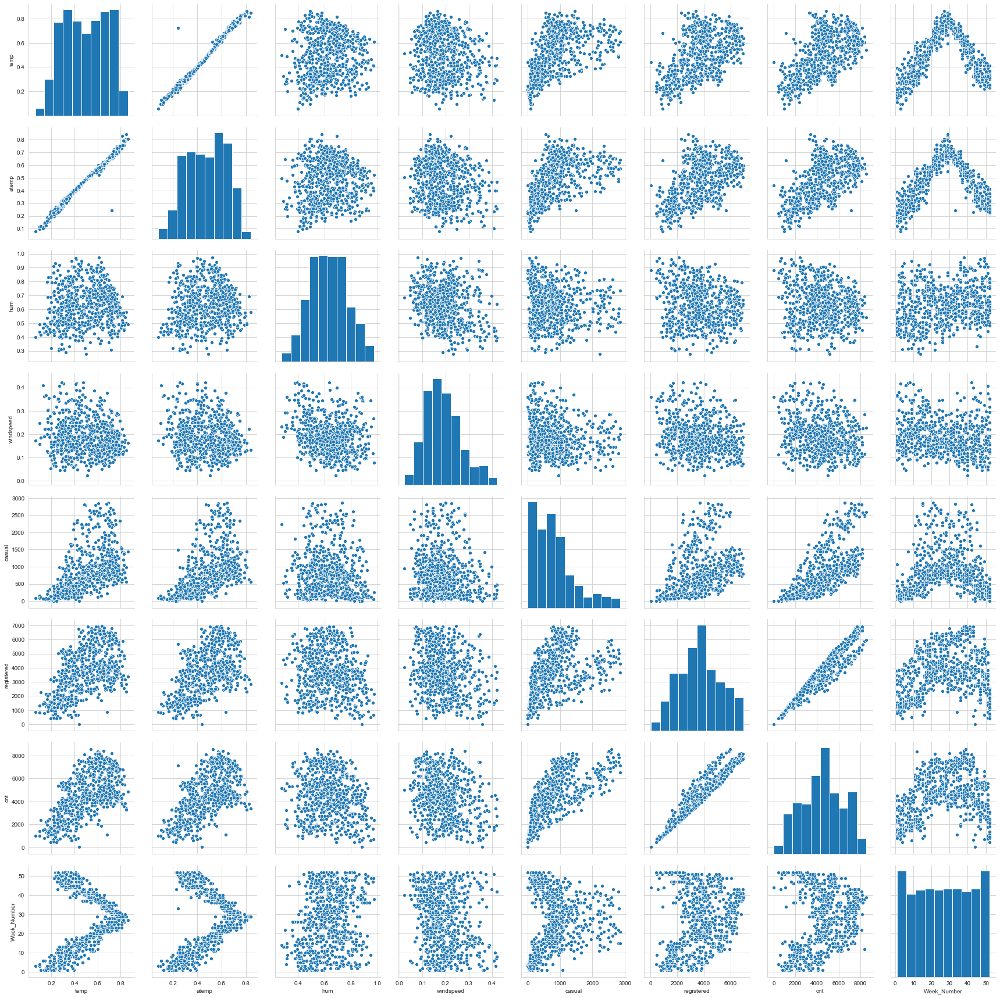

In [173]:
components=df_day.drop(['season','yr','mnth', 'holiday', 'weekday', 'workingday','weathersit'],axis=1).columns

sns.set_style("whitegrid");               #Step1:Set the gird to white.
sns.pairplot(df_day,vars=components ,height=3); #.pairplot(dataset,hue='',size=n) function to plot pairplot
plt.show()

# 4. Data pre-processing and cleaning

## A.Converting all features to numerical features 

#### First we need to convert the string values to int so that we can apply the distance based models like KNN 

## B.Removing outliers using standard methods

In [139]:
# If data has outliers then we can remove them by using zscore<br>
from scipy import stats
z=abs(stats.zscore(df_day))
print(np.where(z>3))
df_day=df_day[(z<3).all(axis=1)]

(array([ 16,  49,  49,  51,  68, 104, 149, 184, 184, 247, 282, 314, 327,
       359, 366, 380, 415, 432, 441, 462, 471, 504, 512, 513, 532, 550,
       611, 623, 644, 646, 681, 691, 724], dtype=int64), array([ 3,  9, 10,  3,  9,  3,  3,  3, 11,  3,  3,  3,  3,  3,  3,  3,  3,
       10, 11, 11,  3, 11, 11,  3, 11,  3,  3, 11, 11,  3,  3,  3,  3],
      dtype=int64))


### C .Train_test Split

In [141]:
y=df_day['cnt']
x=df_day.drop(['cnt'],axis=1)


In [142]:
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.33, random_state=42)

In [143]:
round(X_train, 2)

,season,yr,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,casual,registered,Week_Number
142,2,0,5,0,1,1,2,0.63,0.59,0.81,0.23,836,3438,21
506,2,1,5,0,1,1,2,0.60,0.57,0.81,0.23,630,3729,21
595,3,1,8,0,6,0,1,0.68,0.62,0.60,0.18,2827,5038,33
34,1,0,2,0,5,1,2,0.21,0.23,0.59,0.13,88,1620,5
613,3,1,9,0,3,1,1,0.74,0.71,0.74,0.19,832,6280,36
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
75,1,0,3,0,4,1,1,0.42,0.41,0.60,0.21,424,2320,11
111,2,0,4,0,5,1,2,0.34,0.32,0.73,0.22,177,1506,16
278,4,0,10,0,4,1,1,0.49,0.48,0.62,0.13,639,4126,40
452,2,1,3,0,3,1,1,0.48,0.47,0.48,0.29,674,5024,13


# 5. Building Models

# Model1 : KNN

In [184]:
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsRegressor
neigh = KNeighborsRegressor()

parameters = {'n_neighbors': range(1,10,1)}

clf = GridSearchCV(neigh, parameters, cv= 5)

clf.fit(X_train, y_train)



GridSearchCV(cv=5, error_score='raise-deprecating',
             estimator=KNeighborsRegressor(algorithm='auto', leaf_size=30,
                                           metric='minkowski',
                                           metric_params=None, n_jobs=None,
                                           n_neighbors=5, p=2,
                                           weights='uniform'),
             iid='warn', n_jobs=None, param_grid={'n_neighbors': range(1, 10)},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=0)

In [185]:
clf.best_params_

{'n_neighbors': 2}

In [186]:
#KNN classifier sklearn : https://scikit-learn.org/stable/modules/generated/sklearn.neighbors.KNeighborsClassifier.html
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import r2_score

neigh = KNeighborsRegressor(n_neighbors=2)
neigh.fit(X_train, y_train)

y_test_pred = neigh.predict(X_test)
print(r2_score(y_test,y_test_pred))


0.998304799867039


# Model 2 : Logistic Regression 

# Model 3 : Linear regression 

In [148]:
from sklearn.linear_model import LinearRegression
Lr = LinearRegression()
Lr.fit(X_train, y_train)

y_test_pred = Lr.predict(X_test)

print(r2_score(y_test,y_test_pred))

1.0


# Model 4 : SVM

In [ ]:
from sklearn.svm import SVR

parameters = [{'C': [0.1, 1, 10, 100, 1000],  
              'gamma': [1, 0.1, 0.01, 0.001, 0.0001], 
              'kernel': ['rbf','linear']}]   #'poly','sigmoid' takes too much time

model = GridSearchCV(SVR(),parameters, cv=5)
model.fit(X_train, y_train)    

print(model.best_estimator_)
print(model.score(X_train, y_train))

In [ ]:
model.best_params_

In [180]:
from sklearn.model_selection import cross_val_score

C= [10**-4, 10**-2, 10**0, 10**2, 10**4]
k_scores = []

for k in C:
    #
    svm = SVR(C=k,gamma= 0.0001,kernel='linear')
    
    scores = cross_val_score(svm,X_train, y_train, cv=10)
    
    k_scores.append(scores.mean())
print(k_scores)

[0.9999999986903084, 0.9999999987427742, 0.9999999987427742, 0.9999999987427742, 0.9999999987427742]


In [181]:
import math as mt
log_C=[]
for i in C:
     log_C.append(mt.log10(i))

Text(0, 0.5, 'Cross-Validated Accuracy')

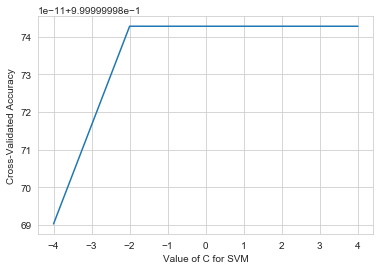

In [182]:
# plot the value of K for KNN (x-axis) versus the cross-validated accuracy (y-axis)
plt.plot(log_C, k_scores)
plt.xlabel('Value of C for SVM')
plt.ylabel('Cross-Validated Accuracy')

In [183]:
from sklearn.svm import SVR

clf = SVR(C=1000,gamma=0.0001,kernel= 'linear')

clf.fit(X_train, y_train)

y_test_pred = clf.predict(X_test)

print(r2_score(y_test,y_test_pred))

0.999999998831616


# Model 5 : Decision Tree

In [155]:
#https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeRegressor


parameters = {'max_depth': [5, 10, 50, 100]}

clf = DecisionTreeRegressor(criterion='mse')

model = GridSearchCV(clf,parameters,cv=3)

model.fit(X_train, y_train)    

print(model.best_estimator_)
print(model.score(X_train, y_train))


DecisionTreeRegressor(criterion='mse', max_depth=50, max_features=None,
                      max_leaf_nodes=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      presort=False, random_state=None, splitter='best')
1.0


In [156]:
model.best_params_

{'max_depth': 50}

In [157]:
from sklearn.model_selection import cross_val_score

max_depth= [1,5,15,25,50]
k_scores = []

for k in max_depth:
    #
    DT = DecisionTreeRegressor(max_depth=k,criterion='mse', min_samples_split=100)
    
    scores = cross_val_score(DT,X_train, y_train, cv=10)
    
    k_scores.append(scores.mean())
print(k_scores)

[0.5592816721845513, 0.8762504178152181, 0.8762504178152181, 0.8762504178152181, 0.8762504178152181]


Text(0, 0.5, 'Cross-Validated Accuracy')

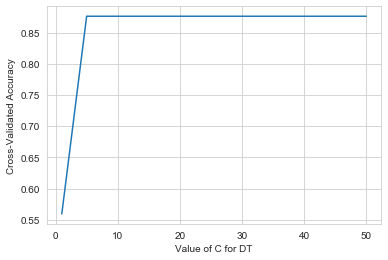

In [158]:
# plot the value of K for KNN (x-axis) versus the cross-validated accuracy (y-axis)
plt.plot(max_depth, k_scores)
plt.xlabel('Value of C for DT')
plt.ylabel('Cross-Validated Accuracy')

# Traning with best hyperparameters

In [159]:
clf = DecisionTreeRegressor(criterion='mse',max_depth=50,min_samples_split=2)

clf.fit(X_train, y_train)


y_test_pred = clf.predict(X_test)

print(r2_score(y_test,y_test_pred))

0.9890890873115011


In [160]:
#https://scikit-learn.org/stable/modules/generated/sklearn.tree.export_graphviz.html
import pydotplus
from sklearn.tree import export_graphviz
from IPython.display import Image
from sklearn.externals.six import StringIO

dot_data = StringIO()

export_graphviz(clf, out_file=dot_data, filled=True, rounded=True, special_characters=True, feature_names=X_train.columns,rotate=True)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())

Image(graph.create_png())

# Model 6 : Ensemble Techniques 

### Note: we have very less data points so applying ensemble techniques is not good idea , i did it to just check the performnace improvement 

## A. Bagging

In [162]:
#https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestRegressor


parameters = {'max_depth': [5, 10, 50, 100],'n_estimators':[10, 20 , 50, 100]}
RF = RandomForestRegressor( criterion='mse')

model = GridSearchCV(RF,parameters, cv=3)

model.fit(X_train, y_train)    

print(model.best_estimator_)
print(model.score(X_train, y_train))


RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=10,
                      max_features='auto', max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, n_estimators=50,
                      n_jobs=None, oob_score=False, random_state=None,
                      verbose=0, warm_start=False)
0.9992335241951106


In [163]:
from sklearn.model_selection import GridSearchCV

RF=RandomForestRegressor(max_depth=100,n_estimators=100,criterion='mse' )
RF.fit(X_train, y_train)

y_test_pred = RF.predict(X_test)

print(r2_score(y_test,y_test_pred))

0.9955139939219249


# Boosting

In [164]:
#https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import GradientBoostingRegressor


parameters = {'max_depth': [5, 10, 50, 100],'n_estimators':[10, 20 , 50, 100]}

clf = GradientBoostingRegressor()

model = GridSearchCV(clf,parameters, cv=3)

model.fit(X_train, y_train)    

print(model.best_estimator_)
print(model.score(X_test, y_test))


GradientBoostingRegressor(alpha=0.9, criterion='friedman_mse', init=None,
                          learning_rate=0.1, loss='ls', max_depth=5,
                          max_features=None, max_leaf_nodes=None,
                          min_impurity_decrease=0.0, min_impurity_split=None,
                          min_samples_leaf=1, min_samples_split=2,
                          min_weight_fraction_leaf=0.0, n_estimators=100,
                          n_iter_no_change=None, presort='auto',
                          random_state=None, subsample=1.0, tol=0.0001,
                          validation_fraction=0.1, verbose=0, warm_start=False)
0.9970832863407937


In [165]:
from sklearn.model_selection import GridSearchCV

clf=GradientBoostingRegressor(max_depth=5,n_estimators=100)
clf.fit(X_train, y_train)

y_test_pred = clf.predict(X_test)

print(r2_score(y_test,y_test_pred))

0.9970594859470061


## Note: As we have very less data stascking is not advisable 

# Xgboost

In [166]:
import xgboost as xgb
xgb_model = xgb.XGBRegressor(random_state=42)

xgb_model.fit(X_train, y_train)


y_test_pred = xgb_model.predict(X_test)

print(r2_score(y_test,y_test_pred))



[01:34:10] WARNING: C:/Jenkins/workspace/xgboost-win64_release_0.90/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
0.9959002939597278


# 6.Model Comparison

In [187]:
#https://stackoverflow.com/questions/18601688/python-prettytable-example

from prettytable import PrettyTable
table = PrettyTable()

#setting column names
table.field_names = [ "Model", "r2_score"]

#setting row values
table.add_row(["KNN", '0.9983' ])
table.add_row(["Linear Regression" ,'1.0' ])
table.add_row(["SVM", '0.9999' ])
table.add_row(["Decision Tree",'0.9890' ])
table.add_row(["RandomForest",'9955' ])
table.add_row(["GBDT" ,'0.9970' ])
table.add_row(["Xgboost",'0.9959' ])
print(table)

+-------------------+----------+
|       Model       | r2_score |
+-------------------+----------+
|        KNN        |  0.9983  |
| Linear Regression |   1.0    |
|        SVM        |  0.9999  |
|   Decision Tree   |  0.9890  |
|    RandomForest   |   9955   |
|        GBDT       |  0.9970  |
|      Xgboost      |  0.9959  |
+-------------------+----------+


Summary:<br>
1.Even simple models like linear regression performs very well , so we use linear regrssion as final model because its more interpretable aslo.   

# 7.Creating Submission File

In [188]:
best_model=Lr
from sklearn.externals import joblib
filename = 'finalized_model.sav'
joblib.dump(best_model, filename)

['finalized_model.sav']